In [5]:
import pandas as pd
import numpy as np
import os
from sklearn.preprocessing import StandardScaler,RobustScaler
from sklearn import metrics
import matplotlib.pyplot as plt
from scipy import signal
import glob
import antropy
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV
from scipy.signal import butter, sosfilt, sosfreqz, detrend,stft
import math
from scipy.signal import stft,find_peaks
from scipy.stats import kurtosis,skew
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler,StandardScaler
import pywt

### Feature Extraction from segmented Prox and IMU timeseries

In [6]:
### Read the detrended data
sensor_ts_df_original = pd.read_parquet(r".\sensor_ts_df_offset.parquet")

In [7]:
sensor_list = ['IMU_1_x','IMU_1_y','IMU_1_z','Prox','IMU_2_x','IMU_2_y','IMU_2_z']

In [8]:
scaled_lst = []
for i in sensor_ts_df_original['File'].unique(): ## Scale for each session
    sensor_series = sensor_ts_df_original.loc[sensor_ts_df_original['File'] == i]
    robust_scale = RobustScaler()
    robust_scale.fit(sensor_series[sensor_list])
    scaled_series = robust_scale.transform(sensor_series[sensor_list])
    scaled_lst.append(pd.DataFrame(scaled_series))
scaled_sensor_ts_df = pd.concat(scaled_lst,axis = 0)

In [9]:
scaled_sensor_ts_df.columns = sensor_list

In [10]:
sensor_ts_df_demed = pd.concat([sensor_ts_df_original[['data_pt','label','label_chewing','label_eating','File']],scaled_sensor_ts_df.reset_index(drop = True)],axis = 1)

In [11]:
def count_zero_crossings(arr):
    return ((arr[:-1].to_numpy() * arr[1:].to_numpy()) < 0).sum()

def find_ten_largest_fft(fft):
    fft_abs = np.abs(fft)
    one_sided_fft = 2*fft_abs[0:int(len(fft)/2.)]/(len(fft)/2)
    new_X = np.linspace(0, int(60/2), int((len(fft)/2)), endpoint=True)
    sorted_idx = np.argsort(one_sided_fft)
    ten_largest_freq = new_X[sorted_idx][-10:]
    ten_largest_freq_magnitude = one_sided_fft[sorted_idx][-10:]
    return ten_largest_freq,ten_largest_freq_magnitude

def find_freq_energy(signal,lower,upper):
    fft_abs = np.abs(signal)
    one_sided_fft = 2*fft_abs[0:int(len(fft_abs)/2.)]/(len(fft_abs)/2)
    freq_energy = (one_sided_fft[int(lower/0.5):int(upper/0.5)+1]**2).sum()
    return freq_energy

def get_spec_energy(fft):
    return np.sum(np.real(fft)*np.real(fft) + np.imag(fft)*np.imag(fft))

def filtering(signal,lowcut,highcut,fs):
    
    def butter_bandpass(lowcut, highcut, fs, order=5):
        nyquist = 0.5 * fs
        low = lowcut / nyquist
        high = highcut / nyquist
        sos = butter(order, [low, high], btype='band', output='sos')
        return sos

    sos = butter_bandpass(lowcut, highcut, fs)

    filtered_data = sosfilt(sos, signal)
    return filtered_data

def plot_fft(signal,ax):
    signal = signal - signal.mean()
    FFT =np.fft.fft(signal)
    new_N=int(len(FFT)/2) 
    f_nat=60
    new_X = np.linspace(10**-12, f_nat/2, new_N, endpoint=True)
    FFT_abs=np.abs(FFT)
    ax.plot(new_X,2*FFT_abs[0:int(len(FFT)/2.)]/len(new_X),color='black')

In [12]:
## Extract 2s window segments for a sensor
def extract_frames(sensor_ts_df,sensor):
    window_size = 120
    window_step = 60
    start = 0
    end = len(sensor_ts_df) - 1
    ts_lst = []
    for win_start in range(start,end,window_step):
        win_end = win_start + window_size
        if win_end >= end:
            break
        frame = sensor_ts_df.iloc[win_start:win_end]
        if np.any(np.abs(frame['Prox'].diff()) > 100): ## discard the window if it contains diff above the threshold
            continue
        Prox_frame = frame[sensor].to_frame().T
        Prox_frame.columns = [i for i in range(120)]
        if frame.iloc[-1]['data_pt'] < frame.iloc[0]['data_pt']:
            continue
        if frame['label_eating'].mean() > 0.5:
            Prox_frame['label_eating'] = 1
            Prox_frame['label_chewing_count'] = frame['label_chewing'].sum()
        else:
            Prox_frame['label_eating'] = 0
            Prox_frame['label_chewing_count'] = 0
        Prox_frame['win_start'] = win_start
        Prox_frame['win_end'] = win_end
        ts_lst.append(Prox_frame)
    ts_df = pd.concat(ts_lst,axis = 0).reset_index(drop = True)
    return ts_df

In [13]:
Prox_demed = extract_frames(sensor_ts_df_demed,'Prox')

In [15]:
## Visualize 2s window segments, compare between 1 and 0 cases in terms of psd, fft, peaks, etc.
def visualize(ts_df,prom_threshold):
    fig,ax = plt.subplots(2,6,figsize = (20,10))
    eating = ts_df.loc[ts_df['label_eating'] == 1].sample(n=3)
    non_eating = ts_df.loc[ts_df['label_eating'] == 0].sample(n=3)
    for i in range(6):
        if i < 3:
            eating_signal = eating.iloc[i][[x for x in range(120)]]
            count = eating.iloc[i]['label_chewing_count']
            #f_psd, Pxx_dens = signal.periodogram(eating_signal, fs = 60)
            #f,t,Zxx = stft(filtering(eating.iloc[i][[x for x in range(120)]],0.1,3,60),120,nperseg = 20,scaling = 'psd')
            peaks = find_peaks(eating_signal,prominence= prom_threshold)
            ax[0,i].plot([x for x in range(120)],eating.iloc[i][[x for x in range(120)]])
            [ax[0,i].axvline(p, c='C3', linewidth=0.3) for p in peaks[0]]
            cwtmatr, freqs = pywt.cwt(eating_signal, np.arange(1, 41), 'mexh')
            ax[0,i+3].imshow(cwtmatr, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',vmax=abs(cwtmatr).max(), vmin=-abs(cwtmatr).max())
            #plot_fft(eating.iloc[i],ax[0,i+3])
            #Pxx_dens_dB = 10*np.log10(Pxx_dens/Pxx_dens.max())
            #ax[0,i+3].plot(f_psd,Pxx_dens_dB)
            ##ax[0,i+3].plot(f,(np.abs(Zxx)**4).mean(axis = 1) / ((np.abs(Zxx)**2).mean(axis = 1))**2 - 2)
            ##ax[0,i+3].plot(f,Pxx_dens)
            print(count)
        else:
            non_eating_signal = non_eating.iloc[i-3][[x for x in range(120)]]
            #f_psd, Pxx_dens = signal.periodogram(non_eating.iloc[i-3][[x for x in range(120)]], fs = 60)
            ##f,t,Zxx = stft(filtering(non_eating.iloc[i-3][[x for x in range(120)]],0.1,3,60),120,nperseg = 20,scaling = 'psd')
            ax[1,(i-3)].plot([x for x in range(120)],non_eating.iloc[i-3][[x for x in range(120)]])
            peaks = find_peaks(non_eating_signal,prominence=prom_threshold)
            [ax[1,(i-3)].axvline(p, c='C3', linewidth=0.3) for p in peaks[0]]
            cwtmatr, freqs = pywt.cwt(non_eating_signal, np.arange(1, 41), 'mexh')
            ax[1,i].imshow(cwtmatr, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',vmax=abs(cwtmatr).max(), vmin=-abs(cwtmatr).max())
            #plot_fft(non_eating.iloc[i-3],ax[1,i])
            #Pxx_dens_dB = 10*np.log10(Pxx_dens/Pxx_dens.max())
            #ax[1,i].plot(f_psd,Pxx_dens_dB)
            ##ax[1,i].plot(f,(np.abs(Zxx)**4).mean(axis = 1) / ((np.abs(Zxx)**2).mean(axis = 1))**2 - 2)
            ##ax[1,i].plot(f,Pxx_dens)
    plt.show()

4.0
4.0
3.0


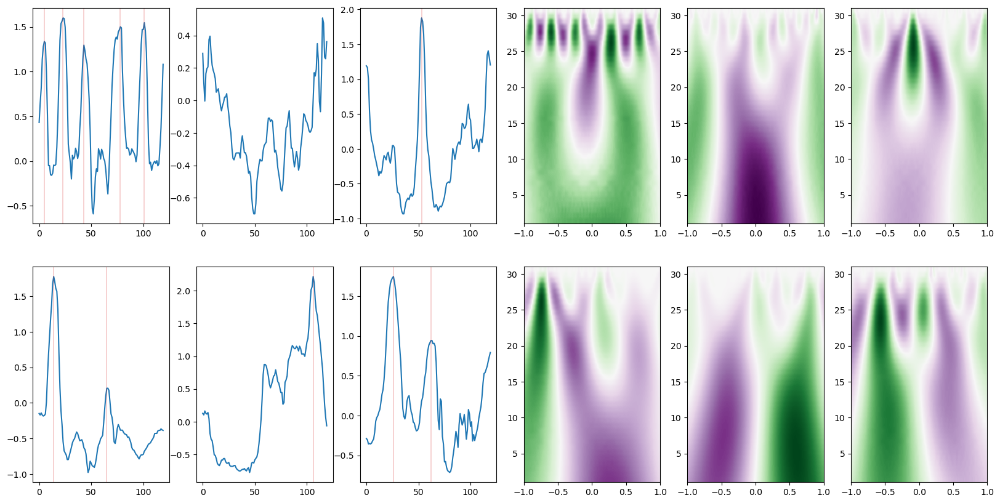

In [16]:
visualize(Prox_demed,0.7)

In [17]:
feature_set = {'MAV':[],'min_t':[],'max_t':[],'range':[],'rms':[],'median':[],'variance':[],'std':[],'skewness':[],'kurtosis':[],'IQR':[],'mean_freq':[],'median_freq':[],'min_PSD':[],'max_PSD':[],'mean_PSD':[],'std_PSD':[],'median_PSD':[],'skewness_PSD':[],'kurtosis_PSD':[],'spectral_kurtosis':[],'spectral_entropy':[],'kurtosis_STFT':[],'skewness_STFT':[],'freq_band_q1':[],'freq_band_q2':[],'freq_band_q3':[],'freq_band_q4':[],'num_peaks':[],'zero_crossings':[]}
label_chewing_detection = []
label_chewing_count = []
window_size = 120
window_step = 60
start = 0
end = len(sensor_ts_df_demed) - 1
for win_start in range(start,end,window_step):
    win_end = win_start + window_size
    if win_end >= end:
        break
    frame = sensor_ts_df_demed.iloc[win_start:win_end]
    if frame.iloc[-1]['data_pt'] < frame.iloc[0]['data_pt']:
        continue
    Prox_demean = frame['Prox']
    if np.any(np.abs(Prox_demean.diff()) > 4): ## discard the window if it contains diff above the threshold
        continue
    Prox_demean = frame['Prox'] - frame['Prox'].mean()
    feature_set['MAV'].append(Prox_demean.abs().mean())
    feature_set['min_t'].append(Prox_demean.min())
    feature_set['max_t'].append(Prox_demean.max())
    feature_set['range'].append(Prox_demean.max()-Prox_demean.min())
    feature_set['rms'].append(math.sqrt((Prox_demean**2).sum()))
    feature_set['median'].append(Prox_demean.quantile(0.5))
    feature_set['variance'].append((Prox_demean.std())**2)
    feature_set['std'].append(Prox_demean.std())
    feature_set['skewness'].append(Prox_demean.skew())
    feature_set['kurtosis'].append(kurtosis(Prox_demean))
    feature_set['IQR'].append(Prox_demean.quantile(0.75)-Prox_demean.quantile(0.25))
    f, Pxx_dens = signal.periodogram(Prox_demean,fs = 60,window = 'hann')
    feature_set['mean_freq'].append((f*Pxx_dens).sum()/Pxx_dens.sum())
    feature_set['median_freq'].append(Pxx_dens.sum()/2)
    f_stft,t_stft,Zxx = stft(Prox_demean,fs = 60,nperseg = 30,scaling = 'psd')
    feature_set['min_PSD'].append(Pxx_dens.min())
    feature_set['max_PSD'].append(Pxx_dens.max())
    feature_set['mean_PSD'].append(Pxx_dens.mean())
    feature_set['std_PSD'].append(Pxx_dens.std())
    feature_set['median_PSD'].append(np.quantile(Pxx_dens,0.5))
    feature_set['skewness_PSD'].append(skew(Pxx_dens))
    feature_set['kurtosis_PSD'].append(kurtosis(Pxx_dens))
    feature_set['spectral_kurtosis'].append(((np.abs(Zxx)**4).mean(axis = 1) / ((np.abs(Zxx)**2).mean(axis = 1))**2 - 2).mean())
    feature_set['spectral_entropy'].append(antropy.spectral_entropy(Prox_demean, sf=60, method='welch', normalize=True))
    feature_set['kurtosis_STFT'].append(kurtosis(np.abs(Zxx),axis = None))
    feature_set['skewness_STFT'].append(skew(np.abs(Zxx),axis = None))
    for i in np.arange(0.5,5.5,0.5).tolist():
        if f'Freq_{i}' in feature_set.keys():
            feature_set[f'Freq_{i}'].append(Pxx_dens[int(i/0.5)])
        else:
            feature_set[f'Freq_{i}'] = [Pxx_dens[int(i/0.5)]]
    FFT = np.fft.fft(Prox_demean)
    ten_largest_fft_idx,ten_largest_fft_mag = find_ten_largest_fft(FFT)
    for i in range(10):
        if (f'Freq_{i}_idx' in feature_set.keys()) and (f'Freq_{i}_mag' in feature_set.keys()):
            feature_set[f'Freq_{i}_idx'].append(ten_largest_fft_idx[i])
            feature_set[f'Freq_{i}_mag'].append(ten_largest_fft_mag[i])
        else:
            feature_set[f'Freq_{i}_idx'] = [ten_largest_fft_idx[i]]
            feature_set[f'Freq_{i}_mag'] = [ten_largest_fft_mag[i]]
    total_energy = get_spec_energy(FFT)
    feature_set['freq_band_q1'].append(find_freq_energy(FFT,0.5,2.5)/total_energy)
    feature_set['freq_band_q2'].append(find_freq_energy(FFT,3.0,5.0)/total_energy)
    feature_set['freq_band_q3'].append(find_freq_energy(FFT,5.5,17.5)/total_energy)
    feature_set['freq_band_q4'].append(find_freq_energy(FFT,18,30.0)/total_energy)
    feature_set['num_peaks'].append(len(find_peaks(Prox_demean,prominence = 0.7)[0]))
    if frame['label_eating'].mean() > 0.5:
        label_chewing_detection.append(1)
        label_chewing_count.append(frame['label_chewing'].sum())
    else:
        label_chewing_detection.append(0)
        label_chewing_count.append(0)
    feature_set['zero_crossings'].append(count_zero_crossings(Prox_demean))
chewing_detection_label = pd.DataFrame(label_chewing_detection).rename(columns = {0:'chewing_detection'})
chewing_count_label = pd.DataFrame(label_chewing_count).rename(columns = {0:'chewing_count'})
features = pd.DataFrame.from_dict(feature_set)
features.columns = [f'Prox_{i}' for i in list(feature_set.keys())]
Prox_features = features
chewing_labels = pd.concat([chewing_detection_label,chewing_count_label],axis = 1)

f:\Users\Dell\anaconda3\envs\py38\lib\site-packages\scipy\signal\_spectral_py.py:1999: UserWarning: nperseg = 256 is greater than input length  = 120, using nperseg = 120
  warnings.warn('nperseg = {0:d} is greater than input length '
f:\Users\Dell\anaconda3\envs\py38\lib\site-packages\scipy\signal\_spectral_py.py:1999: UserWarning: nperseg = 256 is greater than input length  = 120, using nperseg = 120
  warnings.warn('nperseg = {0:d} is greater than input length '
f:\Users\Dell\anaconda3\envs\py38\lib\site-packages\scipy\signal\_spectral_py.py:1999: UserWarning: nperseg = 256 is greater than input length  = 120, using nperseg = 120
  warnings.warn('nperseg = {0:d} is greater than input length '
f:\Users\Dell\anaconda3\envs\py38\lib\site-packages\scipy\signal\_spectral_py.py:1999: UserWarning: nperseg = 256 is greater than input length  = 120, using nperseg = 120
  warnings.warn('nperseg = {0:d} is greater than input length '
f:\Users\Dell\anaconda3\envs\py38\lib\site-packages\scipy\si

In [18]:
Prox_features

,Prox_MAV,Prox_min_t,Prox_max_t,Prox_range,Prox_rms,Prox_median,Prox_variance,Prox_std,Prox_skewness,Prox_kurtosis,...,Prox_Freq_5_idx,Prox_Freq_5_mag,Prox_Freq_6_idx,Prox_Freq_6_mag,Prox_Freq_7_idx,Prox_Freq_7_mag,Prox_Freq_8_idx,Prox_Freq_8_mag,Prox_Freq_9_idx,Prox_Freq_9_mag
0,0.510719,-0.797467,1.352590,2.150057,6.716072,0.064775,0.379039,0.615661,0.402704,-0.712839,...,3.050847,0.285580,2.542373,0.370527,1.525424,0.488485,1.016949,0.568410,0.508475,1.442650
1,0.395605,-0.473400,1.250531,1.723931,5.069651,-0.246053,0.215978,0.464734,0.976727,-0.378440,...,3.050847,0.434870,2.542373,0.453167,2.033898,0.521967,1.525424,0.564420,0.508475,0.635723
2,0.354306,-0.510198,1.255894,1.766092,4.676186,-0.229396,0.183754,0.428665,1.207982,0.261930,...,4.576271,0.265547,2.033898,0.437603,0.508475,0.529986,2.542373,0.554544,1.016949,0.575271
3,0.175460,-0.377642,0.807716,1.185358,2.564256,-0.088533,0.055256,0.235065,1.546064,1.714916,...,3.559322,0.179857,3.050847,0.228252,1.016949,0.257305,1.525424,0.292411,2.033898,0.323648
4,0.299658,-0.459496,1.890253,2.349749,5.283513,-0.153157,0.234584,0.484339,2.650021,6.349982,...,2.542373,0.448418,3.050847,0.457366,0.508475,0.510860,1.525424,0.583902,1.016949,0.631024
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3494,0.076640,-0.146311,0.269123,0.415434,1.042824,-0.020469,0.009139,0.095596,0.698731,-0.162715,...,4.576271,0.068863,2.033898,0.073243,3.050847,0.084404,0.508475,0.132074,1.525424,0.162775
3495,0.078681,-0.126005,0.388475,0.514480,1.042473,-0.007494,0.009132,0.095563,0.793452,0.765278,...,3.050847,0.060201,3.559322,0.089546,1.016949,0.104554,0.508475,0.120901,1.525424,0.128443
3496,0.298973,-0.367994,0.994110,1.362103,4.207415,-0.144455,0.148759,0.385693,1.357290,0.768079,...,2.542373,0.289268,1.016949,0.394610,1.525424,0.420057,2.033898,0.437993,0.508475,0.735277
3497,0.199164,-0.418313,0.805672,1.223985,3.188673,-0.050288,0.085442,0.292305,1.410352,1.644330,...,0.508475,0.210654,2.542373,0.256737,1.016949,0.381723,2.033898,0.427169,1.525424,0.459217


In [19]:
print(chewing_labels[chewing_labels['chewing_detection'] == 0].shape[0])
print(chewing_labels[chewing_labels['chewing_detection'] == 1].shape[0])

1530
1969


In [20]:
chewing_labels.loc[(chewing_labels['chewing_detection'] == 1) & (chewing_labels['chewing_count'] == 0)]

,chewing_detection,chewing_count
14,1,0.0
15,1,0.0
16,1,0.0
17,1,0.0
18,1,0.0
...,...,...
2117,1,0.0
2118,1,0.0
2485,1,0.0
2500,1,0.0


In [21]:
## Split into train, validation, and test sets
test_size = 0.2
X_rest, X_test, y_rest, y_test = train_test_split(Prox_features, chewing_labels['chewing_detection'], test_size=test_size,random_state = 1)
valid_size = 0.2
X_train,X_valid,y_train,y_valid = train_test_split(X_rest,y_rest,test_size = valid_size)

In [22]:
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe
from sklearn.metrics import f1_score

space={'max_depth': hp.quniform("max_depth", 3, 25, 1),
        'gamma': hp.uniform ('gamma', 1,9),
        'reg_alpha' : hp.quniform('reg_alpha', 40,180,1),
        'reg_lambda' : hp.uniform('reg_lambda', 0,1),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1),
        'min_child_weight' : hp.quniform('min_child_weight', 1, 10, 1),
        'n_estimators': 180,
        'seed': 0
    }

def objective(space):
    clf=XGBClassifier(objective = 'binary:logistic',
                    n_estimators =space['n_estimators'], max_depth = int(space['max_depth']), gamma = space['gamma'],
                    reg_alpha = int(space['reg_alpha']),min_child_weight=int(space['min_child_weight']),
                    colsample_bytree=int(space['colsample_bytree']),early_stopping_rounds=20,eval_metric = 'error')
    
    evaluation = [( X_train, y_train),( X_valid, y_valid)]
    
    clf.fit(X_train, y_train,
            eval_set=evaluation,verbose=False)
    
    pred = clf.predict(X_valid).round()
    accuracy = accuracy_score(y_valid, pred)
    print ("SCORE:", accuracy)
    return {'loss': -accuracy, 'status': STATUS_OK }
    
trials = Trials()

best_hyperparams = fmin(fn = objective,
                        space = space,
                        algo = tpe.suggest,
                        max_evals = 300,
                        trials = trials)

SCORE:                                                 
0.6803571428571429                                     
SCORE:                                                 
0.6785714285714286                                                                
SCORE:                                                                            
0.6589285714285714                                                                
SCORE:                                                                            
0.6821428571428572                                                                
SCORE:                                                                            
0.6821428571428572                                                                
SCORE:                                                                            
0.6589285714285714                                                                
SCORE:                                                                            
0.

In [23]:
best_hyperparams

{'colsample_bytree': 0.6447885870794043,
 'gamma': 1.0038643956401807,
 'max_depth': 14.0,
 'min_child_weight': 5.0,
 'reg_alpha': 51.0,
 'reg_lambda': 0.13338100064471792}

In [24]:
best_hyperparams_hist = {'colsample_bytree': 0.6068195624248094,
 'gamma': 1.0723106792292443,
 'max_depth': 15.0,
 'min_child_weight': 6.0,
 'reg_alpha': 54.0,
 'reg_lambda': 0.5512104764155182}

In [25]:
best_hyperparams['max_depth'] = int(best_hyperparams['max_depth'])

In [26]:
model_hyperopt_prox = XGBClassifier(**best_hyperparams,n_estimators = 180,seed = 0)

In [27]:
model_hyperopt_prox.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.6447885870794043, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=1.0038643956401807, gpu_id=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=14,
              max_leaves=None, min_child_weight=5.0, missing=nan,
              monotone_constraints=None, n_estimators=180, n_jobs=None,
              num_parallel_tree=None, predictor=None, random_state=None, ...)

In [28]:
y_pred = model_hyperopt_prox.predict(X_test)
predictions = [round(value) for value in y_pred]
accuracy = metrics.accuracy_score(y_test, predictions)
precision = metrics.precision_score(y_test, predictions)
recall = metrics.recall_score(y_test, predictions)
f1_score = metrics.f1_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))
print("Precision: %.2f%%" % (precision * 100.0))
print("Recall: %.2f%%" % (recall * 100.0))
print("f1_score: %.2f%%" % (f1_score * 100.0))

Accuracy: 66.57%
Precision: 69.93%
Recall: 76.98%
f1_score: 73.29%


In [29]:
print(metrics.classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.60      0.51      0.55       283
           1       0.70      0.77      0.73       417

    accuracy                           0.67       700
   macro avg       0.65      0.64      0.64       700
weighted avg       0.66      0.67      0.66       700



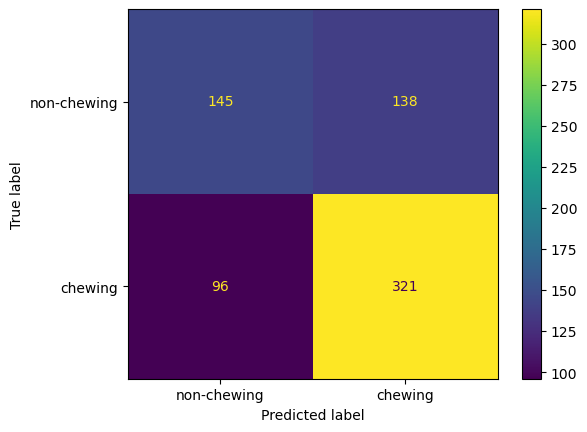

In [30]:
cm = metrics.confusion_matrix(y_test, predictions, labels=[0,1])
disp = metrics.ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=['non-chewing','chewing'])
disp.plot()
plt.show()

### IMU Features

In [256]:
def IMU_feature_extract(sensor_ts_df,sensor):
    feature_set = {'MAV':[],'min_t':[],'max_t':[],'range':[],'rms':[],'median':[],'variance':[],'std':[],'skewness':[],'kurtosis':[],'IQR':[],'mean_freq':[],'median_freq':[],'min_PSD':[],'max_PSD':[],'mean_PSD':[],'std_PSD':[],'median_PSD':[],'skewness_PSD':[],'kurtosis_PSD':[],'spectral_kurtosis':[],'spectral_entropy':[],'kurtosis_STFT':[],'skewness_STFT':[],'freq_band_q1':[],'freq_band_q2':[],'freq_band_q3':[],'freq_band_q4':[],'num_peaks':[],'zero_crossings':[]}
    #label_chewing_detection = []
    #label_chewing_count = []
    window_size = 120
    window_step = 60
    start = 0
    end = len(sensor_ts_df) - 1
    for win_start in range(start,end,window_step):
        win_end = win_start + window_size
        if win_end >= end:
            break
        frame = sensor_ts_df.iloc[win_start:win_end]
        if frame.iloc[-1]['data_pt'] < frame.iloc[0]['data_pt']:
            continue
        if np.any(np.abs(frame['Prox'].diff()) > 4):
            continue
        Prox_demean = pd.Series(filtering(frame[sensor],0.1,5,60))
        feature_set['MAV'].append(Prox_demean.abs().mean())
        feature_set['min_t'].append(Prox_demean.min())
        feature_set['max_t'].append(Prox_demean.max())
        feature_set['range'].append(Prox_demean.max()-Prox_demean.min())
        feature_set['rms'].append(math.sqrt((Prox_demean**2).sum()))
        feature_set['median'].append(Prox_demean.quantile(0.5))
        feature_set['variance'].append((Prox_demean.std())**2)
        feature_set['std'].append(Prox_demean.std())
        feature_set['skewness'].append(Prox_demean.skew())
        feature_set['kurtosis'].append(kurtosis(Prox_demean))
        feature_set['IQR'].append(Prox_demean.quantile(0.75)-Prox_demean.quantile(0.25))
        f, Pxx_dens = signal.periodogram(Prox_demean,fs = 60,window = 'hann')
        feature_set['mean_freq'].append((f*Pxx_dens).sum()/Pxx_dens.sum())
        feature_set['median_freq'].append(Pxx_dens.sum()/2)
        f_stft,t_stft,Zxx = stft(Prox_demean,fs = 60,nperseg = 30,scaling = 'psd')
        feature_set['min_PSD'].append(Pxx_dens.min())
        feature_set['max_PSD'].append(Pxx_dens.max())
        feature_set['mean_PSD'].append(Pxx_dens.mean())
        feature_set['std_PSD'].append(Pxx_dens.std())
        feature_set['median_PSD'].append(np.quantile(Pxx_dens,0.5))
        feature_set['skewness_PSD'].append(skew(Pxx_dens))
        feature_set['kurtosis_PSD'].append(kurtosis(Pxx_dens))
        feature_set['spectral_kurtosis'].append(((np.abs(Zxx)**4).mean(axis = 1) / ((np.abs(Zxx)**2).mean(axis = 1))**2 - 2).mean())
        feature_set['spectral_entropy'].append(antropy.spectral_entropy(Prox_demean, sf=60, method='welch', normalize=True))
        feature_set['kurtosis_STFT'].append(kurtosis(np.abs(Zxx),axis = None))
        feature_set['skewness_STFT'].append(skew(np.abs(Zxx),axis = None))
        for i in np.arange(0.5,5.5,0.5).tolist():
            if f'Freq_{i}' in feature_set.keys():
                feature_set[f'Freq_{i}'].append(Pxx_dens[int(i/0.5)])
            else:
                feature_set[f'Freq_{i}'] = [Pxx_dens[int(i/0.5)]]
        FFT = np.fft.fft(Prox_demean)
        total_energy = get_spec_energy(FFT)
        feature_set['freq_band_q1'].append(find_freq_energy(FFT,0.5,2.5)/total_energy)
        feature_set['freq_band_q2'].append(find_freq_energy(FFT,3.0,5.0)/total_energy)
        feature_set['freq_band_q3'].append(find_freq_energy(FFT,5.5,17.5)/total_energy)
        feature_set['freq_band_q4'].append(find_freq_energy(FFT,18,30.0)/total_energy)
        feature_set['num_peaks'].append(len(find_peaks(Prox_demean,prominence = 0.5)[0]))
        #if frame['label_eating'].mean() > 0.5:
            #label_chewing_detection.append(1)
            #label_chewing_count.append(frame['label_chewing'].sum())
        #else:
            #label_chewing_detection.append(0)
            #label_chewing_count.append(0)
        feature_set['zero_crossings'].append(count_zero_crossings(Prox_demean))
    features = pd.DataFrame.from_dict(feature_set)
    features.columns = [f'{sensor}_{i}' for i in list(feature_set.keys())]
    return features

In [234]:
IMU_1 = pd.DataFrame(np.sqrt((sensor_ts_df_demed[['IMU_1_x', 'IMU_1_y', 'IMU_1_z']]**2).sum(axis = 1)))

In [235]:
IMU_1.columns = ['IMU_1']

In [236]:
IMU_2 = pd.DataFrame(np.sqrt((sensor_ts_df_demed[['IMU_2_x', 'IMU_2_y', 'IMU_2_z']]**2).sum(axis = 1)))
IMU_2.columns = ['IMU_2']

In [242]:
IMU_ts = pd.concat([sensor_ts_df_demed[['data_pt','Prox','label','label_eating','label_chewing']],IMU_1,IMU_2],axis = 1)

In [243]:
IMU_ts

,data_pt,Prox,label,label_eating,label_chewing,IMU_1,IMU_2
0,0.0,-0.738170,nan,0,0.0,2.347161,1.452966
1,1.0,-0.735016,nan,0,0.0,2.415493,1.551074
2,2.0,-0.747634,nan,0,0.0,2.328256,1.248769
3,3.0,-0.801262,nan,0,0.0,2.418149,1.931431
4,4.0,-0.817035,nan,0,0.0,2.489288,1.080836
...,...,...,...,...,...,...,...
1076335,2921.0,4.428571,nan,0,0.0,1.921581,0.750108
1076336,2922.0,4.349206,nan,0,0.0,1.570288,0.731544
1076337,2923.0,4.285714,nan,0,0.0,1.523077,0.704660
1076338,2924.0,4.142857,nan,0,0.0,1.532169,0.737171


In [245]:
IMU_1_frames = extract_frames(IMU_ts,'IMU_1')

5.0
4.0
6.0


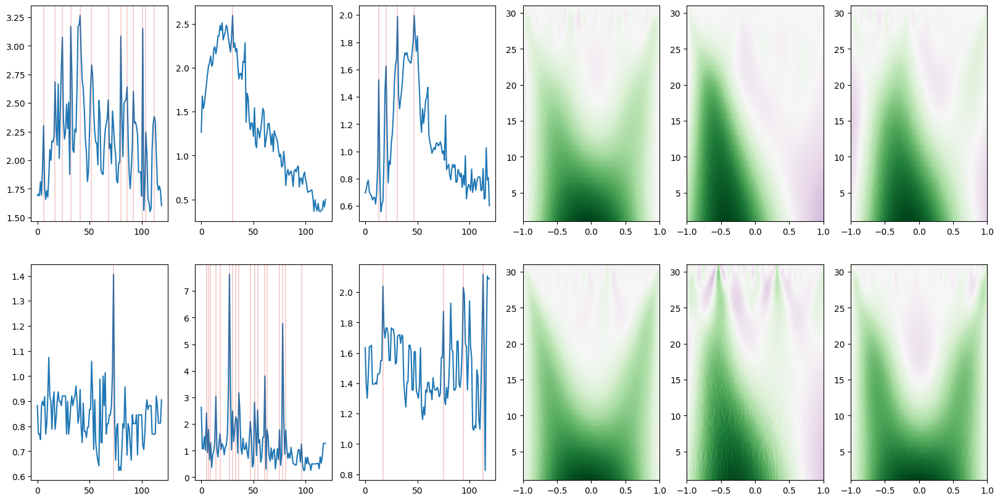

In [252]:
visualize(IMU_1_frames,0.6)

In [258]:
mag_IMU_features_list = []
for i in ['IMU_1', 'IMU_2']:
    mag_IMU_features = IMU_feature_extract(IMU_ts,i)
    mag_IMU_features_list.append(mag_IMU_features)

d:\ProgramFiles\anaconda\envs\mnn\lib\site-packages\scipy\signal\_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 120, using nperseg = 120
  warnings.warn('nperseg = {0:d} is greater than input length '
d:\ProgramFiles\anaconda\envs\mnn\lib\site-packages\scipy\signal\_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 120, using nperseg = 120
  warnings.warn('nperseg = {0:d} is greater than input length '
d:\ProgramFiles\anaconda\envs\mnn\lib\site-packages\scipy\signal\_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 120, using nperseg = 120
  warnings.warn('nperseg = {0:d} is greater than input length '
d:\ProgramFiles\anaconda\envs\mnn\lib\site-packages\scipy\signal\_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 120, using nperseg = 120
  warnings.warn('nperseg = {0:d} is greater than input length '
d:\ProgramFiles\anaconda\envs\mnn\lib\site-packages\scipy\si

In [259]:
mag_IMU_features = pd.concat(mag_IMU_features_list,axis = 1)

In [260]:
mag_IMU_features

,IMU_1_MAV,IMU_1_min_t,IMU_1_max_t,IMU_1_range,IMU_1_rms,IMU_1_median,IMU_1_variance,IMU_1_std,IMU_1_skewness,IMU_1_kurtosis,...,IMU_2_Freq_0.5,IMU_2_Freq_1.0,IMU_2_Freq_1.5,IMU_2_Freq_2.0,IMU_2_Freq_2.5,IMU_2_Freq_3.0,IMU_2_Freq_3.5,IMU_2_Freq_4.0,IMU_2_Freq_4.5,IMU_2_Freq_5.0
0,0.833008,-1.650693,2.398538,4.049231,11.170375,-0.347005,1.029452,1.014619,0.737047,-0.125909,...,0.244731,0.156953,0.013047,0.001125,0.002709,0.006486,0.002879,0.001098,0.000471,0.002429
1,0.546429,-1.514875,0.998780,2.513655,7.300394,0.106773,0.447412,0.668889,-0.628129,-0.569170,...,0.683582,0.184866,0.007142,0.002457,0.004261,0.005623,0.004831,0.009917,0.011116,0.007765
2,0.635984,-0.942369,2.435577,3.377946,9.219620,-0.280533,0.707679,0.841236,1.603265,2.001081,...,0.049289,0.030665,0.016843,0.002476,0.003250,0.002966,0.008383,0.009324,0.000111,0.001585
3,0.440095,-0.778398,1.121490,1.899888,5.738295,-0.168714,0.275386,0.524772,0.693511,-0.642625,...,0.097295,0.052222,0.008496,0.001821,0.001421,0.000649,0.000844,0.001220,0.001102,0.000362
4,0.377609,-0.502162,1.345955,1.848117,5.160550,-0.205610,0.222459,0.471656,1.284654,0.891276,...,0.181345,0.008235,0.001684,0.000310,0.000030,0.000089,0.000013,0.000111,0.000351,0.000483
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17662,0.373193,-0.744280,1.097936,1.842216,4.895181,-0.176230,0.197662,0.444592,0.803421,-0.001660,...,0.272818,0.000683,0.017432,0.000253,0.000081,0.000053,0.001707,0.001350,0.002019,0.000940
17663,0.411746,-0.905284,1.133294,2.038577,5.769356,0.043497,0.258917,0.508839,0.170904,-0.706075,...,0.131742,0.003326,0.000727,0.016076,0.006381,0.006787,0.001686,0.000091,0.001359,0.000050
17664,0.737398,-2.212749,1.746537,3.959286,10.299982,0.001528,0.889552,0.943161,-0.078915,-0.268446,...,0.087746,0.046717,0.025867,0.009448,0.000492,0.003007,0.004613,0.001896,0.001059,0.000978
17665,0.656665,-1.300918,2.466545,3.767463,9.311242,-0.112526,0.725658,0.851856,0.880885,0.455478,...,0.357767,0.040760,0.023614,0.005776,0.002792,0.000221,0.001901,0.002800,0.001513,0.000350


In [109]:
IMU_features = pd.concat(IMU_features_list,axis = 1)

In [36]:
IMU_features

,IMU_2_z_MAV,IMU_2_z_min_t,IMU_2_z_max_t,IMU_2_z_range,IMU_2_z_rms,IMU_2_z_median,IMU_2_z_variance,IMU_2_z_std,IMU_2_z_skewness,IMU_2_z_kurtosis,...,IMU_2_z_Freq_0.5,IMU_2_z_Freq_1.0,IMU_2_z_Freq_1.5,IMU_2_z_Freq_2.0,IMU_2_z_Freq_2.5,IMU_2_z_Freq_3.0,IMU_2_z_Freq_3.5,IMU_2_z_Freq_4.0,IMU_2_z_Freq_4.5,IMU_2_z_Freq_5.0
0,0.324052,-0.827544,0.085250,0.912794,4.144223,-0.246218,0.044976,0.212076,-0.657480,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.364665,-0.492562,0.928843,1.421406,4.578150,0.050459,0.153884,0.392281,0.137878,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.543001,-0.001432,0.928843,0.930275,6.087415,0.554870,0.024845,0.157622,-0.445906,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.456537,0.129976,0.860554,0.730578,5.153975,0.450042,0.020749,0.144043,0.480662,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.403848,0.196744,0.551259,0.354515,4.414301,0.416050,0.004932,0.070230,-0.435779,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17662,1.321175,-1.762029,-0.695608,1.066421,14.476545,-1.366679,0.061671,0.248336,0.547649,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17663,0.962647,-1.630572,-0.351754,1.278818,10.948275,-0.954095,0.107555,0.327956,-0.072975,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17664,0.745084,-1.552003,-0.037155,1.514847,9.307038,-0.723455,0.193249,0.439601,-0.113293,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17665,0.435735,-1.552003,0.497458,2.049461,6.835208,-0.122311,0.333413,0.577419,-0.993331,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


###  Proximity & IMU magnitude

In [261]:
features = pd.concat([Prox_features,mag_IMU_features],axis = 1)

In [262]:
## Split into train, validation, and test sets
test_size = 0.2
X_rest, X_test, y_rest, y_test = train_test_split(features, chewing_labels['chewing_detection'], test_size=test_size,random_state = 1)
valid_size = 0.2
X_train,X_valid,y_train,y_valid = train_test_split(X_rest,y_rest,test_size = valid_size)

In [263]:
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe
from sklearn.metrics import f1_score

space={'max_depth': hp.quniform("max_depth", 3, 25, 1),
        'gamma': hp.uniform ('gamma', 1,9),
        'reg_alpha' : hp.quniform('reg_alpha', 40,180,1),
        'reg_lambda' : hp.uniform('reg_lambda', 0,1),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1),
        'min_child_weight' : hp.quniform('min_child_weight', 1, 10, 1),
        'n_estimators': 180,
        'seed': 0
    }

def objective(space):
    clf=XGBClassifier(objective = 'binary:logistic',
                    n_estimators =space['n_estimators'], max_depth = int(space['max_depth']), gamma = space['gamma'],
                    reg_alpha = int(space['reg_alpha']),min_child_weight=int(space['min_child_weight']),
                    colsample_bytree=int(space['colsample_bytree']),early_stopping_rounds=20,eval_metric = 'error')
    
    evaluation = [( X_train, y_train),( X_valid, y_valid)]
    
    clf.fit(X_train, y_train,
            eval_set=evaluation,verbose=False)
    
    pred = clf.predict(X_valid).round()
    accuracy = accuracy_score(y_valid, pred)
    print ("SCORE:", accuracy)
    return {'loss': -accuracy, 'status': STATUS_OK }
    
trials = Trials()

best_hyperparams = fmin(fn = objective,
                        space = space,
                        algo = tpe.suggest,
                        max_evals = 300,
                        trials = trials)

  0%|          | 0/300 [00:00<?, ?trial/s, best loss=?]

SCORE:                                                 
0.5267067562787408                                     
SCORE:                                                                            
0.5574814290767598                                                                
SCORE:                                                                            
0.5267067562787408                                                                
SCORE:                                                                            
0.5666784577290414                                                                
SCORE:                                                                            
0.568800848956491                                                                 
SCORE:                                                                            
0.5267067562787408                                                               
SCORE:                                                     

In [264]:
best_hyperparams

{'colsample_bytree': 0.7019752292601426,
 'gamma': 1.6507881347709887,
 'max_depth': 9.0,
 'min_child_weight': 1.0,
 'reg_alpha': 43.0,
 'reg_lambda': 0.34611036861735056}

In [265]:
best_hyperparams['max_depth'] = int(best_hyperparams['max_depth'])

In [266]:
model_hyperopt_Prox_imu = XGBClassifier(**best_hyperparams,n_estimators = 180,seed = 0)

In [267]:
model_hyperopt_Prox_imu.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.7019752292601426, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=1.6507881347709887,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=9, max_leaves=None,
              min_child_weight=1.0, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=180, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [268]:
y_pred = model_hyperopt_Prox_imu.predict(X_test)
predictions = [round(value) for value in y_pred]
accuracy = metrics.accuracy_score(y_test, predictions)
precision = metrics.precision_score(y_test, predictions)
recall = metrics.recall_score(y_test, predictions)
f1_score = metrics.f1_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))
print("Precision: %.2f%%" % (precision * 100.0))
print("Recall: %.2f%%" % (recall * 100.0))
print("f1_score: %.2f%%" % (f1_score * 100.0))

Accuracy: 59.56%
Precision: 57.60%
Recall: 50.73%
f1_score: 53.95%


In [269]:
print(metrics.classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.61      0.67      0.64      1884
           1       0.58      0.51      0.54      1650

    accuracy                           0.60      3534
   macro avg       0.59      0.59      0.59      3534
weighted avg       0.59      0.60      0.59      3534



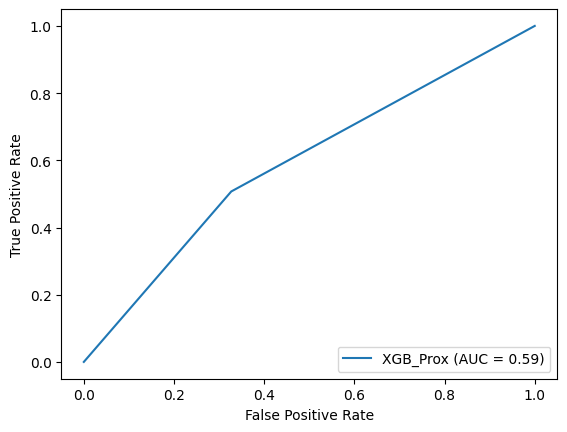

In [270]:
fpr, tpr, thresholds = metrics.roc_curve(y_test, predictions)
roc_auc = metrics.auc(fpr, tpr)
display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc,estimator_name='XGB_Prox')
display.plot()
plt.show()

### Training with all features

In [37]:
all_features = pd.concat([Prox_features,IMU_features],axis = 1)

In [38]:
## Split into train, validation, and test sets
test_size = 0.2
X_rest, X_test, y_rest, y_test = train_test_split(all_features, chewing_labels['chewing_detection'], test_size=test_size,random_state = 1)
valid_size = 0.2
X_train,X_valid,y_train,y_valid = train_test_split(X_rest,y_rest,test_size = valid_size)

In [39]:
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe
from sklearn.metrics import f1_score

space={'max_depth': hp.quniform("max_depth", 3, 25, 1),
        'gamma': hp.uniform ('gamma', 1,9),
        'reg_alpha' : hp.quniform('reg_alpha', 40,180,1),
        'reg_lambda' : hp.uniform('reg_lambda', 0,1),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1),
        'min_child_weight' : hp.quniform('min_child_weight', 1, 10, 1),
        'n_estimators': 180,
        'seed': 0
    }

def objective(space):
    clf=XGBClassifier(objective = 'binary:logistic',
                    n_estimators =space['n_estimators'], max_depth = int(space['max_depth']), gamma = space['gamma'],
                    reg_alpha = int(space['reg_alpha']),min_child_weight=int(space['min_child_weight']),
                    colsample_bytree=int(space['colsample_bytree']),early_stopping_rounds=20,eval_metric = 'error')
    
    evaluation = [( X_train, y_train),( X_valid, y_valid)]
    
    clf.fit(X_train, y_train,
            eval_set=evaluation,verbose=False)
    
    pred = clf.predict(X_valid).round()
    accuracy = accuracy_score(y_valid, pred)
    print ("SCORE:", accuracy)
    return {'loss': -accuracy, 'status': STATUS_OK }
    
trials = Trials()

best_hyperparams = fmin(fn = objective,
                        space = space,
                        algo = tpe.suggest,
                        max_evals = 300,
                        trials = trials)

SCORE:                                                 
0.5631411390166254                                     
SCORE:                                                                            
0.5726918995401485                                                                
SCORE:                                                                            
0.5231694375663247                                                                
SCORE:                                                                            
0.568800848956491                                                                 
SCORE:                                                                            
0.5231694375663247                                                                
SCORE:                                                                            
0.5733993632826317                                                                
SCORE:                                                    

In [40]:
best_hyperparams

{'colsample_bytree': 0.8754685634753147,
 'gamma': 1.816013856564283,
 'max_depth': 16.0,
 'min_child_weight': 1.0,
 'reg_alpha': 53.0,
 'reg_lambda': 0.6811490419099486}

In [41]:
best_hyperparams['max_depth'] = int(best_hyperparams['max_depth'])

In [42]:
model_hyperopt_all = XGBClassifier(**best_hyperparams,n_estimators = 180,seed = 0)

In [43]:
model_hyperopt_all.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8754685634753147, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=1.816013856564283,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=16, max_leaves=None,
              min_child_weight=1.0, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=180, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [44]:
y_pred = model_hyperopt_all.predict(X_test)
predictions = [round(value) for value in y_pred]
accuracy = metrics.accuracy_score(y_test, predictions)
precision = metrics.precision_score(y_test, predictions)
recall = metrics.recall_score(y_test, predictions)
f1_score = metrics.f1_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))
print("Precision: %.2f%%" % (precision * 100.0))
print("Recall: %.2f%%" % (recall * 100.0))
print("f1_score: %.2f%%" % (f1_score * 100.0))

Accuracy: 56.31%
Precision: 53.63%
Recall: 52.47%
f1_score: 53.04%


In [45]:
print(metrics.classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.59      0.60      0.59      1872
           1       0.54      0.52      0.53      1662

    accuracy                           0.56      3534
   macro avg       0.56      0.56      0.56      3534
weighted avg       0.56      0.56      0.56      3534



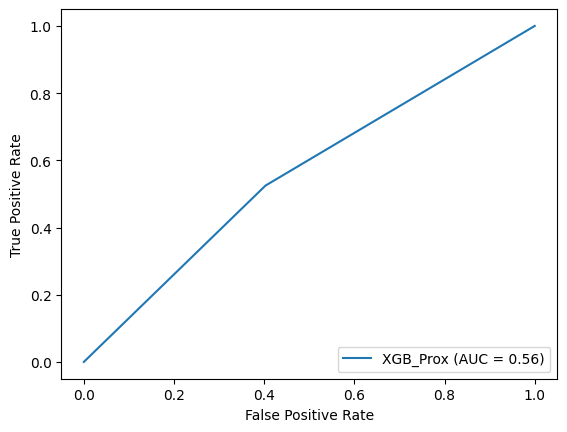

In [46]:
fpr, tpr, thresholds = metrics.roc_curve(y_test, predictions)
roc_auc = metrics.auc(fpr, tpr)
display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc,estimator_name='XGB_Prox')
display.plot()
plt.show()